In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import warnings
warnings.filterwarnings('ignore')
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from PIL import Image
import tensorflow
from tensorflow import keras
from tensorflow.keras.applications import ResNet50
from keras.applications.vgg19 import VGG19
from tensorflow.keras.layers import GlobalAveragePooling2D, Dense
from tensorflow.keras.models import Model
import matplotlib
import pandas as pd
import numpy as np
import os
import tensorflow as tf
import cv2
from tensorflow import keras
from tensorflow.keras import utils
from tensorflow.keras.utils import image_dataset_from_directory
from tensorflow.keras.layers import Dense, Input, InputLayer, Flatten
from tensorflow.keras.models import Sequential, Model
from tensorflow.keras import layers
from tensorflow.keras.layers import Dropout
from matplotlib import pyplot as plt
import matplotlib.image as mpimg
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [2]:
path = r"/kaggle/input//ip-102/Classes/0 rice leaf roller/"
# change the working directory to the path where the images are located
os.chdir(path)
labels = []
count = 0
with os.scandir(path) as files:
  # loops through each file in the directory
    for insect in files:
        count += 1
        labels.append(insect.name)
        
print(count)

1115


In [3]:
path = r"/kaggle/input//ip-102/Classes/0 rice leaf roller/"
# change the working directory to the path where the images are located
os.chdir(path)

# this list holds all the image filename
flowers = []
count = 0
# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        flowers.append(file.name)
        
print(len(flowers))

1115


In [4]:
from keras.preprocessing.image import load_img 
from keras.preprocessing.image import img_to_array 
from keras.applications.vgg16 import preprocess_input 

# models 
from keras.applications.vgg19 import VGG19 
from keras.models import Model

# clustering and dimension reduction
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# for everything else
import os
import numpy as np
import matplotlib.pyplot as plt
from random import randint
import pandas as pd
import pickle

path = r"/kaggle/input//ip-102/Classes/0 rice leaf roller/"
# change the working directory to the path where the images are located
os.chdir(path)

print("Scanning Directory ")
# this list holds all the image filename
flowers = []
count = 0
# creates a ScandirIterator aliased as files
with os.scandir(path) as files:
  # loops through each file in the directory
    for file in files:
        flowers.append(path + "/" + file.name)
            
            
            
model = VGG19()
model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features
   
data = {}

print("Extracting Features")
# lop through each image in the dataset
count = 0
for flower in flowers:
    count += 1
    print(count)
    feat = extract_features(flower,model)
    data[flower] = feat
          
 
# get a list of the filenames
filenames = np.array(list(data.keys()))

# get a list of just the features
feat = np.array(list(data.values()))

# reshape so that there are 210 samples of 4096 vectors
feat = feat.reshape(-1,4096)

# get the unique labels (from the flower_labels.csv)
# df = pd.read_csv('flower_labels.csv')
# label = df['label'].tolist()
unique_labels = labels

print("Reducing Dimentions")
# reduce the amount of dimensions in the feature vector
pca = PCA(n_components=100, random_state=22)
pca.fit(feat)
x = pca.transform(feat)

Scanning Directory 


2022-03-08 19:44:29.250342: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-08 19:44:29.347964: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-08 19:44:29.348666: I tensorflow/stream_executor/cuda/cuda_gpu_executor.cc:937] successful NUMA node read from SysFS had negative value (-1), but there must be at least one NUMA node, so returning NUMA node zero
2022-03-08 19:44:29.349838: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compil

574726144/574710816 [==============================] - 4s 0us/step
Extracting Features
1


2022-03-08 19:44:36.533364: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:185] None of the MLIR Optimization Passes are enabled (registered 2)
2022-03-08 19:44:37.470361: I tensorflow/stream_executor/cuda/cuda_dnn.cc:369] Loaded cuDNN version 8005


2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277
27

In [5]:
print("Clustering Feature vectors")
# cluster feature vectors
kmeans = KMeans(n_clusters=7,n_jobs=-1, random_state=22)
kmeans.fit(x)

# holds the cluster id and the images { id: [images] }
groups = {}
for file, cluster in zip(filenames,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

Clustering Feature vectors


In [6]:
# function that lets you view a cluster (based on identifier)        
def view_cluster(cluster):
    plt.figure(figsize = (25,25));
    # gets the list of filenames for a cluster
    files = groups[cluster]
    # only allow up to 30 images to be shown at a time
    if len(files) > 100:
        print(f"Clipping cluster size from {len(files)} to 100")
        files = files[:100]
    # plot each image in the cluster
    for index, file in enumerate(files):
        plt.subplot(10,10,index+1);
        img = load_img(file)
        img = np.array(img)
        plt.imshow(img)
        plt.axis('off')

Clipping cluster size from 202 to 100


202

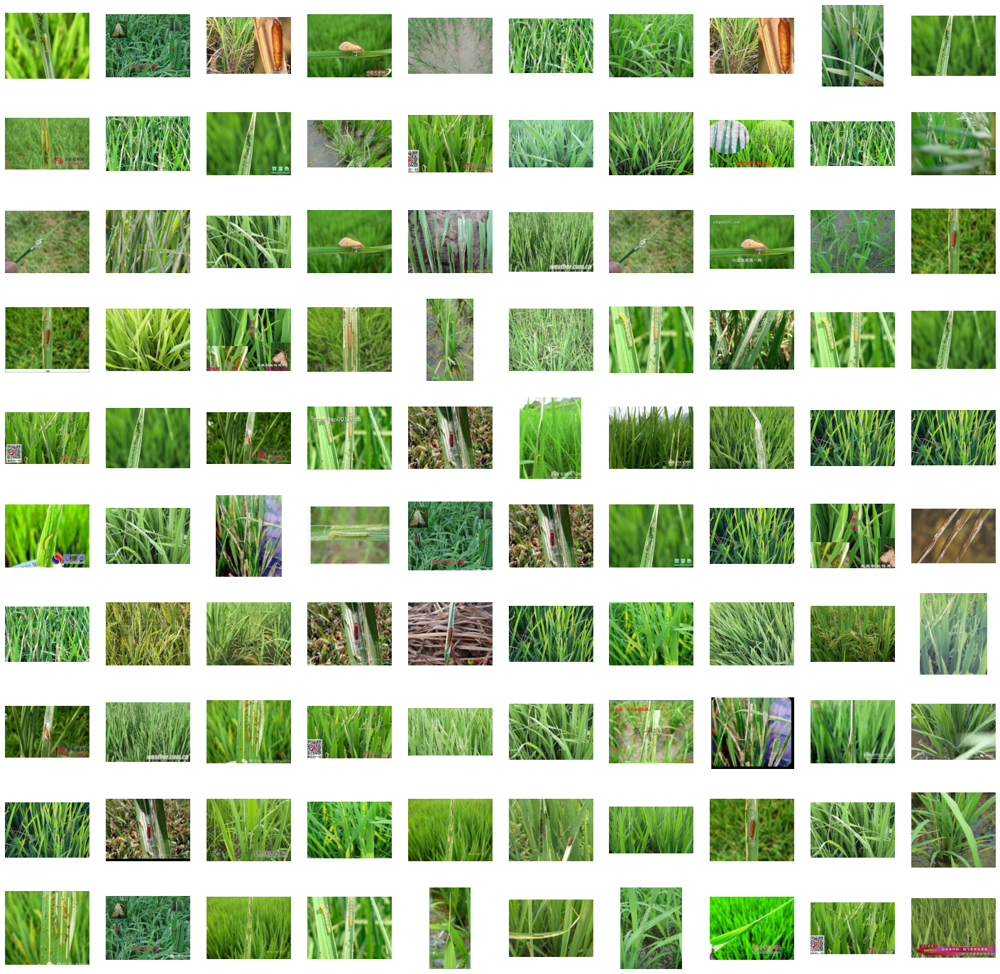

In [7]:
view_cluster(0)
len(groups[0])

Clipping cluster size from 202 to 100


202

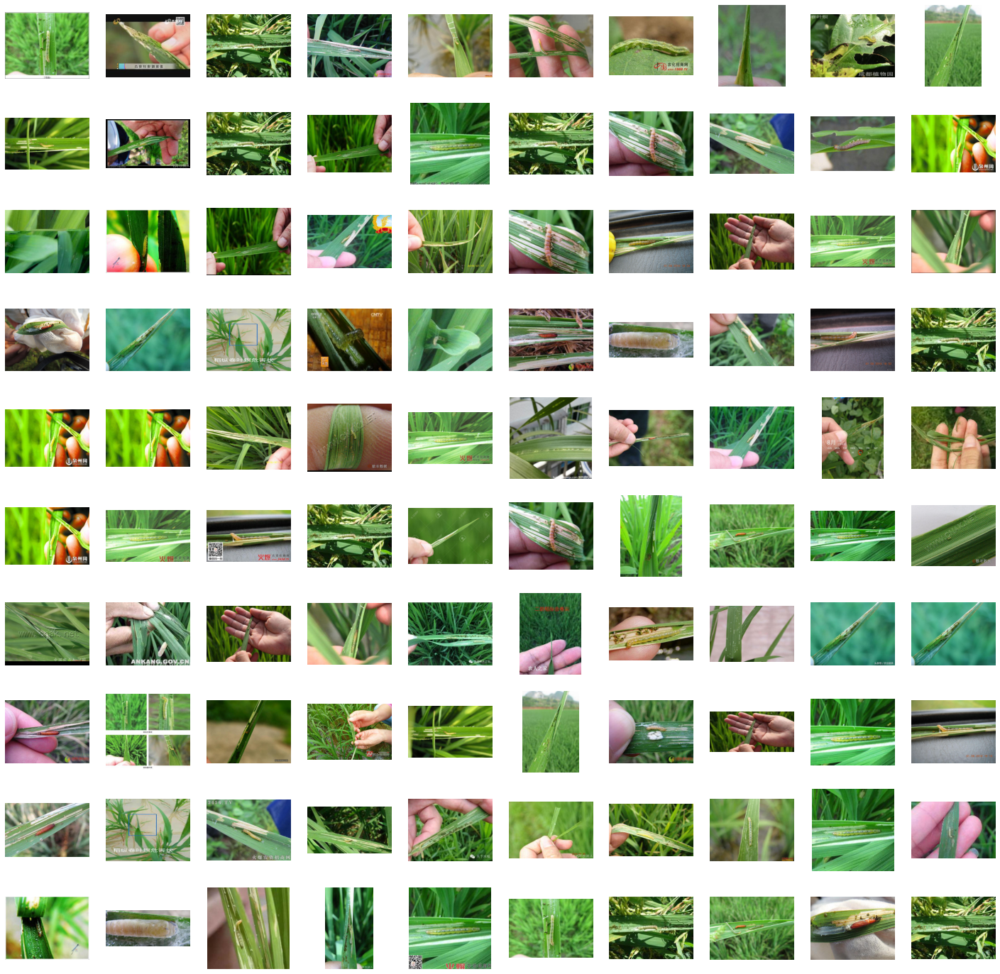

In [8]:
view_cluster(1)
len(groups[1])

Clipping cluster size from 163 to 100


163

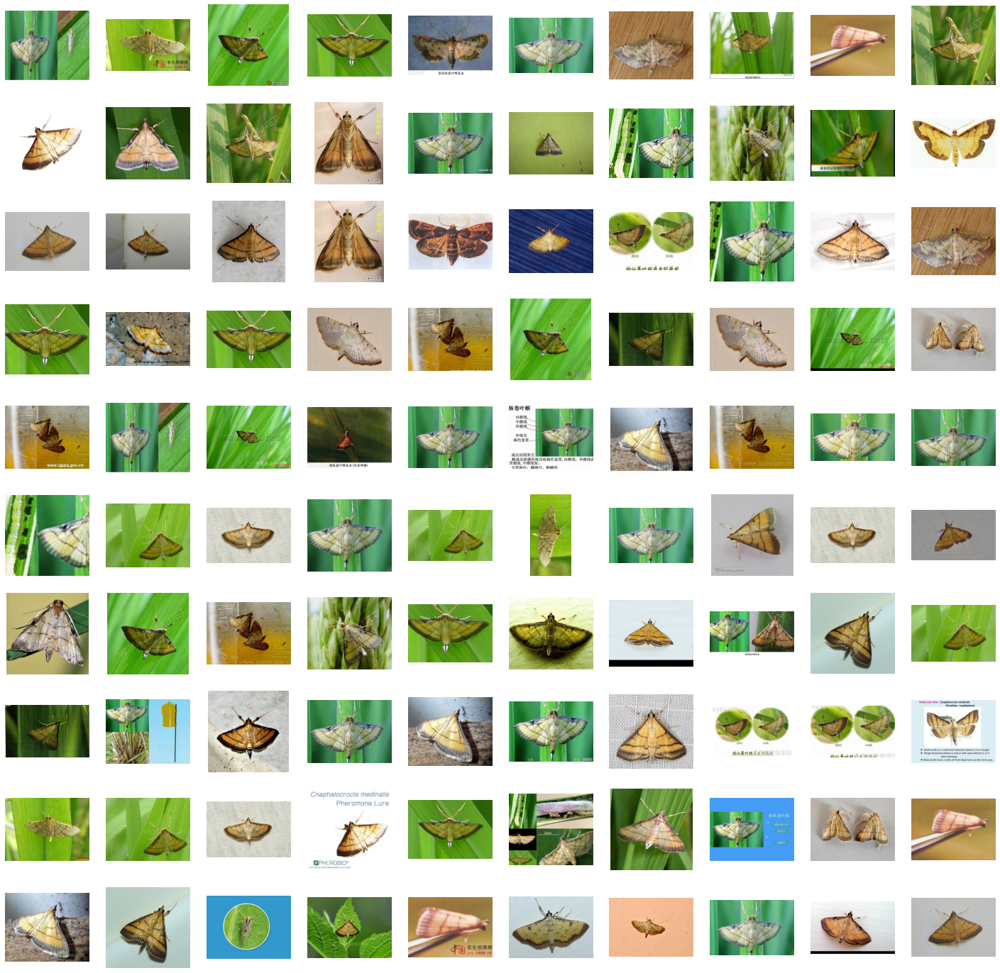

In [9]:
view_cluster(2)
len(groups[2])

Clipping cluster size from 156 to 100


156

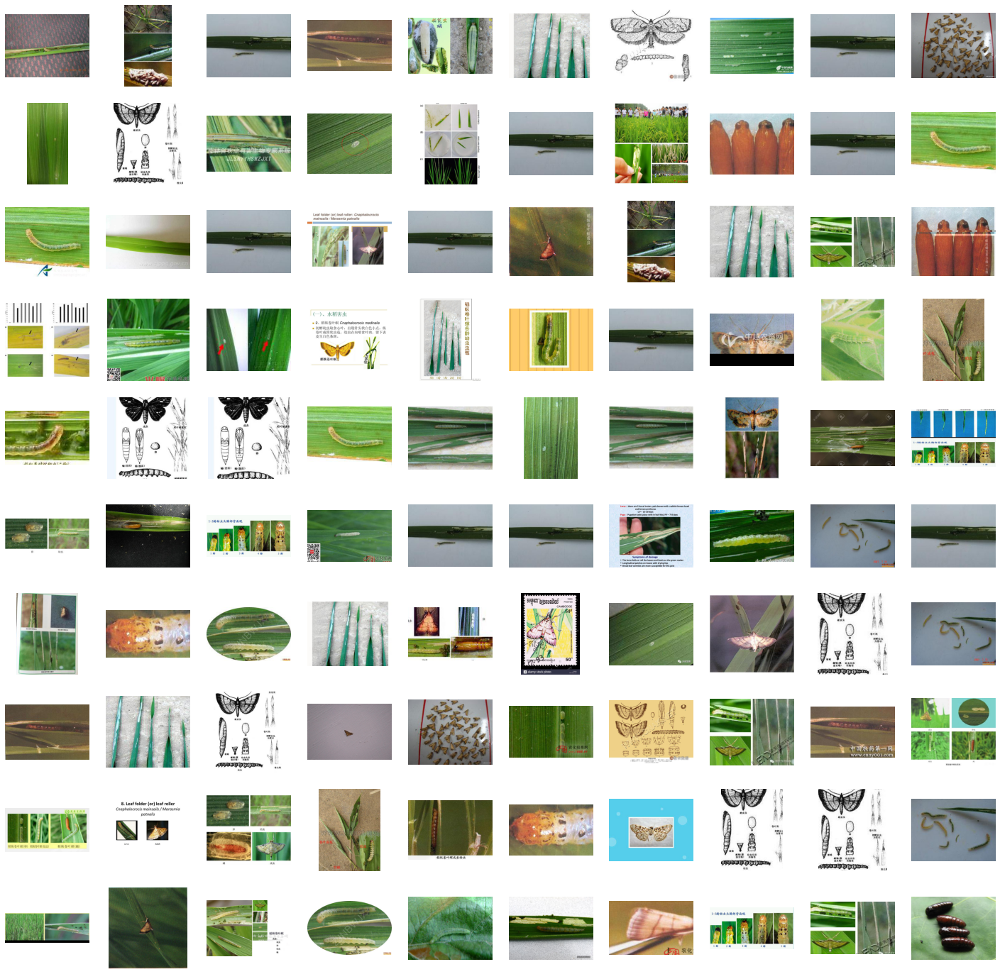

In [10]:
view_cluster(3)
len(groups[3])

Clipping cluster size from 107 to 100


107

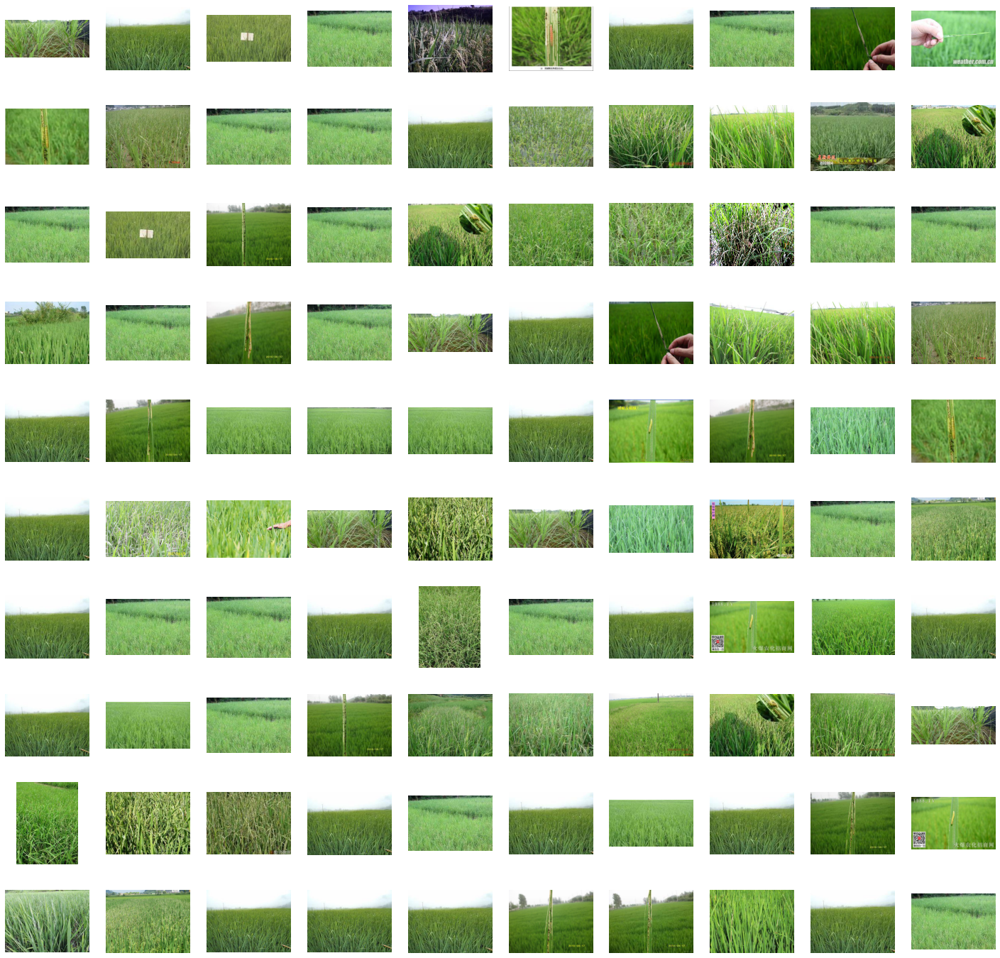

In [11]:
view_cluster(4)
len(groups[4])

64

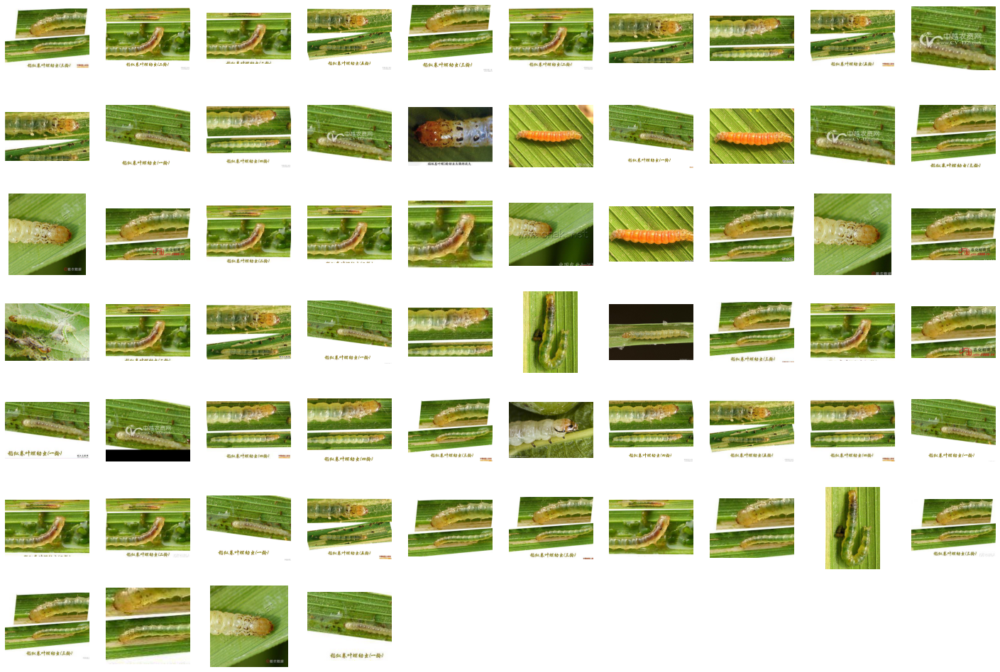

In [12]:
view_cluster(5)
len(groups[5])

Clipping cluster size from 221 to 100


221

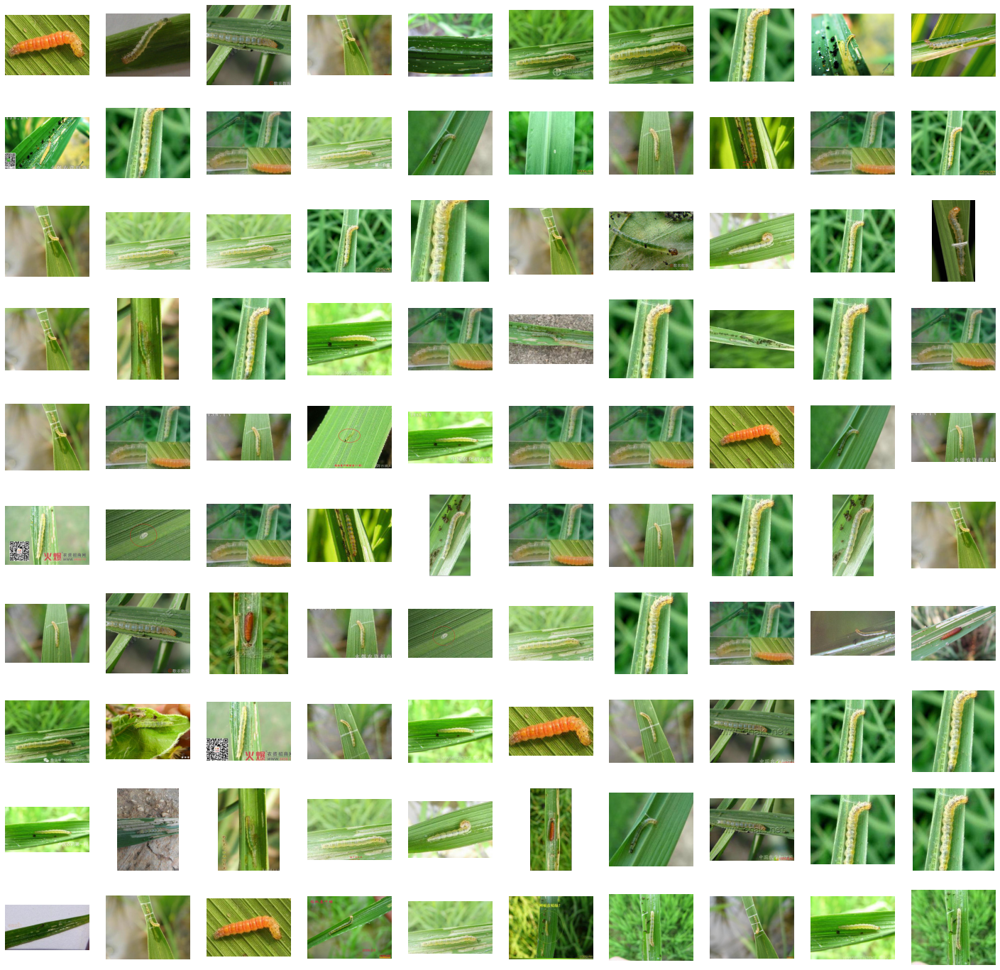

In [13]:
view_cluster(6)
len(groups[6])

In [14]:
groups[1][0]

'/kaggle/input//ip-102/Classes/0 rice leaf roller//00847.jpg'

In [ ]:
import pandas as pd
df = pd.DataFrame()
df2 = df.assign(cluster = groups[6])
df2.to_csv("/kaggle/working/6rice leaf roller.csv",index=False)